In [1]:
import pandas as pd
import numpy as np
import numpy as np
import matplotlib.pyplot as plt

In [32]:
dtypes = {
    "id": "string",
    "ra": "float32",
    "dec": "float32",
    "parallax": "float32",
    "err_mag_pstotal_r": "float32",
    "err_mag_pstotal_i": "float32",
    "err_mag_pstotal_j0660": "float32",
    "gaia_ruwe": "float32",
    "gaia_parallax_over_error": "float32",
    "gaia_classprob_dsc_combmod_star": "float32",
    "gaia_in_qso_candidates": "int8",
    "gaia_in_galaxy_candidates": "int8",
    "gaia_phot_bp_rp_excess_factor": "float32",
    "mag_pstotal_r": "float32",
    "mag_pstotal_i": "float32",
    "mag_pstotal_j0660": "float32",
}

df = pd.read_csv(
    "../data/all_0.7frac.csv",
    engine="pyarrow",
    dtype=dtypes,
    usecols=list(dtypes.keys())
)

In [ ]:
# df = pd.read_csv('/home/gustavo/splus_gaia/matches/STRIPE82-0115_match.csv')

In [33]:
df = df[(df['err_mag_pstotal_j0660'] < 0.2)&
        (df['err_mag_pstotal_i'] < 0.2)&
        (df['err_mag_pstotal_r'] < 0.2)&
        (df['mag_pstotal_j0660']/df['err_mag_pstotal_j0660'] > 10)&
        (df['mag_pstotal_i']/df['err_mag_pstotal_i'] > 10)&
        (df['mag_pstotal_r']/df['err_mag_pstotal_r'] > 10)&
        (df['gaia_ruwe'] < 1.4) &
        (df['gaia_parallax_over_error'] > 3) &
        (df['gaia_classprob_dsc_combmod_star'] > 0.5) &
        (df['gaia_in_qso_candidates'] == 0) &
        (df['gaia_in_galaxy_candidates'] == 0) &
        (df['gaia_phot_bp_rp_excess_factor'].between(1.0, 1.3))]

In [34]:
df = df[df['mag_pstotal_r'].between(14, 21)]

In [35]:
len(df)

3873452

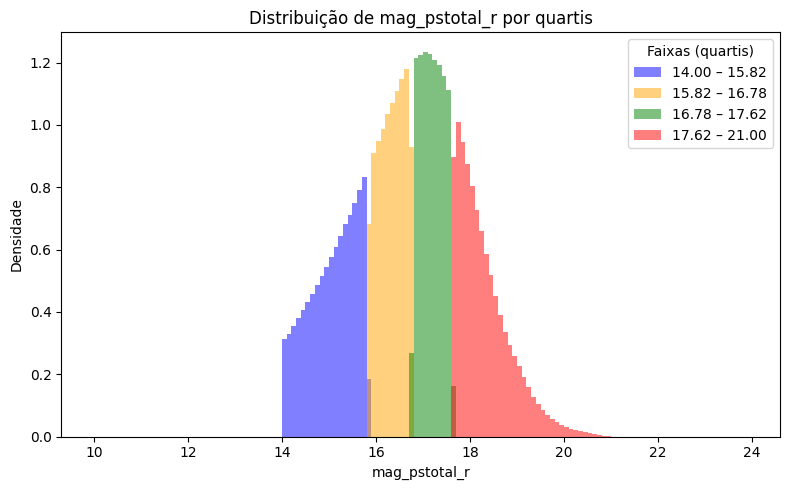

In [36]:
# Quartis
quartis = np.percentile(df['mag_pstotal_r'], [25, 50, 75])
colors = ['blue', 'orange', 'green', 'red']

# Limites dos quartis (incluindo min e max)
q_bounds = [df['mag_pstotal_r'].min()] + quartis.tolist() + [df['mag_pstotal_r'].max()]

plt.figure(figsize=(8,5))

for i in range(4):
    lower = q_bounds[i]
    upper = q_bounds[i+1]

    if i == 0:
        subset = df[df['mag_pstotal_r'] <= upper]
    elif i == 3:
        subset = df[df['mag_pstotal_r'] > lower]
    else:
        subset = df[(df['mag_pstotal_r'] > lower) & (df['mag_pstotal_r'] <= upper)]

    plt.hist(
        subset['mag_pstotal_r'],
        bins=np.arange(10, 24, 0.1),
        density=True,
        alpha=0.5,
        color=colors[i],
        label=f'{lower:.2f} – {upper:.2f}'
    )

plt.xlabel('mag_pstotal_r')
plt.ylabel('Densidade')
plt.title('Distribuição de mag_pstotal_r por quartis')
plt.legend(title='Faixas (quartis)')
plt.tight_layout()
plt.show()

In [50]:
df1 = df[df['mag_pstotal_r'] < 16]
df2 = df[(df['mag_pstotal_r'] > 16) & (df['mag_pstotal_r'] <= 17)]
df3 = df[(df['mag_pstotal_r'] > 17) & (df['mag_pstotal_r'] <= 18)]
df4 = df[(df['mag_pstotal_r'] > 18) & (df['mag_pstotal_r'] <= 21)]

In [51]:
len(df1+df2+df3+df4)

3873450

/tmp/ipykernel_93070/1453245182.py:111: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


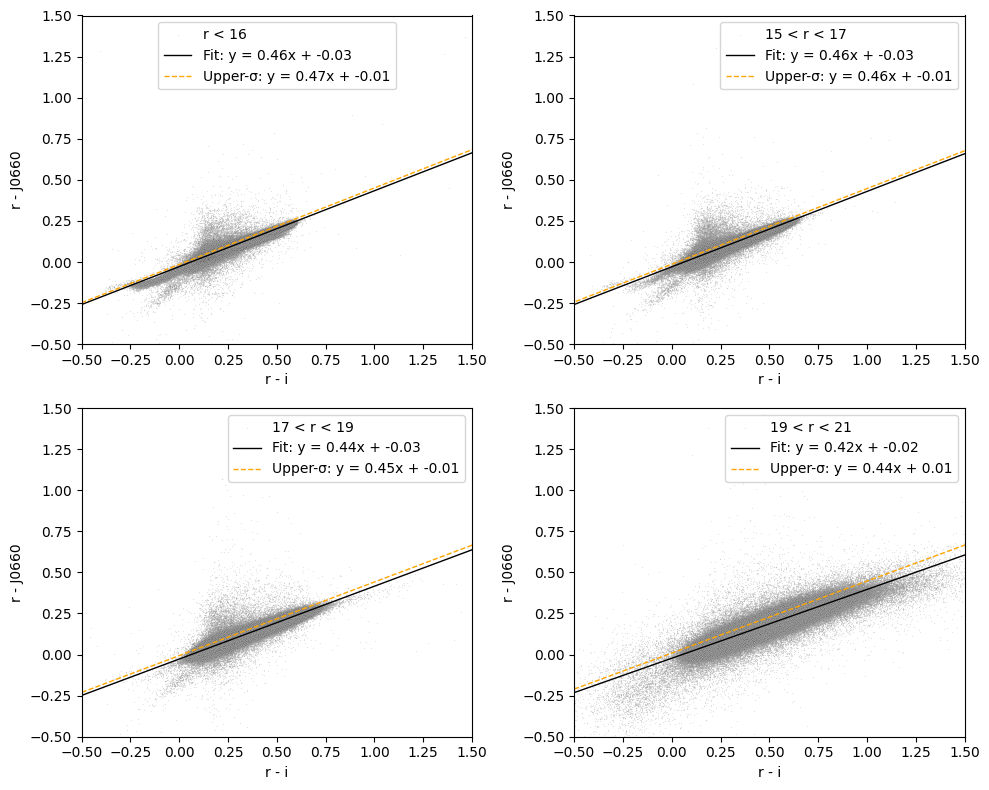

In [43]:
def plot_scatter_with_two_fits(ax, x_series, y_series, label,
                               color_upper='orange',
                               color_basic='black',
                               k_lower=0.5, k_upper=3.0,
                               max_iter=4, min_pts=20):
    """
    Plota pontos, um ajuste linear básico e um ajuste upper-envelope via σ-clipping iterativo.
    """

    # === Limpeza dos dados ===
    x = np.asarray(x_series, dtype=float)
    y = np.asarray(y_series, dtype=float)
    mask = np.isfinite(x) & np.isfinite(y)
    x, y = x[mask], y[mask]

    # === Scatter plot ===
    ax.scatter(
        x, y, s=0.5,
        label=label,
        color='white',
        alpha=0.3,
        edgecolors='black',
        linewidths=0.1
    )

    # === Fit básico ===
    if x.size >= 2 and not np.isclose(x.std(), 0.0):
        try:
            m_basic, b_basic = np.polyfit(x, y, 1)
            xmin, xmax = ax.get_xlim()
            if not np.isfinite([xmin, xmax]).all() or xmin == xmax:
                xmin, xmax = (x.min(), x.max())
            x_fit = np.linspace(xmin, xmax, 100)
            y_fit = m_basic * x_fit + b_basic
            ax.plot(x_fit, y_fit, lw=1, color=color_basic,
                    label=f'Fit: y = {m_basic:.2f}x + {b_basic:.2f}')
        except np.linalg.LinAlgError:
            ax.text(0.02, 0.9, "Falha no ajuste (SVD)",
                    transform=ax.transAxes, va='top', ha='left', fontsize=8)
    else:
        ax.text(0.02, 0.95, "Sem variância/pts p/ ajuste",
                transform=ax.transAxes, va='top', ha='left', fontsize=8)

    # === Upper-envelope fit ===
    if x.size >= min_pts and not np.isclose(x.std(), 0.0):
        try:
            # Ajuste inicial
            m, b = np.polyfit(x, y, 1)
            prev_n = len(x)

            for _ in range(max_iter):
                r = y - (m * x + b)
                mad = np.median(np.abs(r - np.median(r)))
                sigma = 1.4826 * mad if mad > 0 else r.std()
                if not np.isfinite(sigma) or sigma == 0:
                    break

                keep = (r > -k_lower * sigma) & (r < k_upper * sigma)
                if keep.sum() < min_pts or keep.sum() == prev_n:
                    break

                x, y = x[keep], y[keep]
                prev_n = x.size

                m, b = np.polyfit(x, y, 1)

            xmin, xmax = ax.get_xlim()
            if not np.isfinite([xmin, xmax]).all() or xmin == xmax:
                xmin, xmax = (x.min(), x.max())
            x_fit = np.linspace(xmin, xmax, 100)
            y_fit = m * x_fit + b

            ax.plot(x_fit, y_fit, color=color_upper, lw=1, linestyle='--',
                    label=f'Upper-σ: y = {m:.2f}x + {b:.2f}')

        except np.linalg.LinAlgError:
            ax.text(0.02, 0.85, "Falha upper σ-fit",
                    transform=ax.transAxes, va='top', ha='left', fontsize=8)
            
# ---- Seu código com os quatro painéis ----
plt.figure(figsize=(10, 8))
ax1 = plt.subplot(221)
ax2 = plt.subplot(222)
ax3 = plt.subplot(223)
ax4 = plt.subplot(224)

plot_scatter_with_two_fits(ax1,
    df1['mag_pstotal_r'] - df1['mag_pstotal_i'],
    df1['mag_pstotal_r'] - df1['mag_pstotal_j0660'], 'r < 16'
)
plot_scatter_with_two_fits(ax2,
    df2['mag_pstotal_r'] - df2['mag_pstotal_i'],
    df2['mag_pstotal_r'] - df2['mag_pstotal_j0660'], '15 < r < 17'
)
plot_scatter_with_two_fits(ax3,
    df3['mag_pstotal_r'] - df3['mag_pstotal_i'],
    df3['mag_pstotal_r'] - df3['mag_pstotal_j0660'], '17 < r < 19'
)
plot_scatter_with_two_fits(ax4,
    df4['mag_pstotal_r'] - df4['mag_pstotal_i'],
    df4['mag_pstotal_r'] - df4['mag_pstotal_j0660'], '19 < r < 21'
)

for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xlabel('r - i')
    ax.set_ylabel('r - J0660')
    ax.set_ylim(-0.5, 1.5)
    ax.set_xlim(-0.5, 1.5)
    ax.legend()

plt.tight_layout()
plt.show()

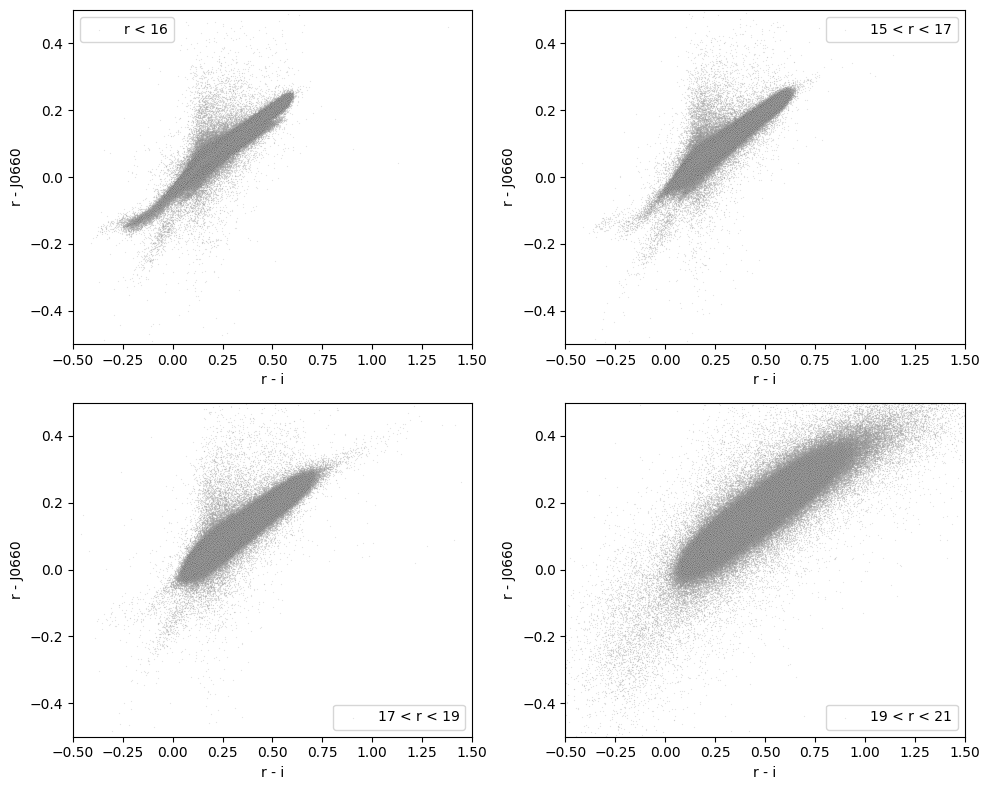

In [54]:
# ---- Seu código com os quatro painéis ----
plt.figure(figsize=(10, 8))
ax1 = plt.subplot(221)
ax2 = plt.subplot(222)
ax3 = plt.subplot(223)
ax4 = plt.subplot(224)

ax1.scatter((df1['mag_pstotal_r'] - df1['mag_pstotal_i']), (df1['mag_pstotal_r'] - df1['mag_pstotal_j0660']), label = 'r < 16',
s=0.5,
color='white',
alpha=0.3,
edgecolors='black',
linewidths=0.1)

ax2.scatter((df2['mag_pstotal_r'] - df2['mag_pstotal_i']), (df2['mag_pstotal_r'] - df2['mag_pstotal_j0660']), label = '15 < r < 17',
s=0.5,
color='white',
alpha=0.3,
edgecolors='black',
linewidths=0.1)

ax3.scatter((df3['mag_pstotal_r'] - df3['mag_pstotal_i']), (df3['mag_pstotal_r'] - df3['mag_pstotal_j0660']), label = '17 < r < 19',
s=0.5,
color='white',
alpha=0.3,
edgecolors='black',
linewidths=0.1)

ax4.scatter((df4['mag_pstotal_r'] - df4['mag_pstotal_i']), (df4['mag_pstotal_r'] - df4['mag_pstotal_j0660']), label = '19 < r < 21',
s=0.5,
color='white',
alpha=0.3,
edgecolors='black',
linewidths=0.1)


for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xlabel('r - i')
    ax.set_ylabel('r - J0660')
    ax.set_ylim(-0.5, 0.5)
    ax.set_xlim(-0.5, 1.5)
    ax.legend()

plt.tight_layout()
plt.show()

In [44]:
import numpy as np
import matplotlib.pyplot as plt

# ---------- Utilidades ----------
def color_vectors_from_df(df):
    x = (df['mag_pstotal_r'] - df['mag_pstotal_i']).to_numpy(float)       # (r - i)
    y = (df['mag_pstotal_r'] - df['mag_pstotal_j0660']).to_numpy(float)   # (r - J0660)

    # erros individuais de magnitude
    er = df['err_mag_pstotal_r'].to_numpy(float)
    ei = df['err_mag_pstotal_i'].to_numpy(float)
    ej = df['err_mag_pstotal_j0660'].to_numpy(float)

    # erros das cores
    sig_x = np.sqrt(er**2 + ei**2)   # σ_(r-i)
    sig_y = np.sqrt(er**2 + ej**2)   # σ_(r-J0660)
    return x, y, sig_x, sig_y

def fit_upper_sigma_clipped(x, y, k_lower=0.5, k_upper=3.0, max_iter=4, min_pts=20):
    """Retorna m, b, rms e máscara final usada no ajuste (upper-envelope σ-clipping)."""
    mask = np.isfinite(x) & np.isfinite(y)
    x, y = x[mask], y[mask]
    if x.size < min_pts or np.isclose(x.std(), 0.0):
        return None, None, None, mask

    m, b = np.polyfit(x, y, 1)
    prev_n = len(x)
    for _ in range(max_iter):
        r = y - (m*x + b)
        mad = np.median(np.abs(r - np.median(r)))
        sigma = 1.4826*mad if mad > 0 else r.std()
        if not np.isfinite(sigma) or sigma == 0:
            break

        keep = (r > -k_lower*sigma) & (r < k_upper*sigma)
        if keep.sum() < min_pts or keep.sum() == prev_n:
            break
        x, y = x[keep], y[keep]
        prev_n = x.size
        m, b = np.polyfit(x, y, 1)

    # RMS dos resíduos (no conjunto final usado)
    resid = y - (m*x + b)
    rms = np.sqrt(np.mean(resid**2)) if resid.size else None
    # reconstrói máscara global (opcional)
    mask_final = np.isfinite(mask)
    return m, b, rms, mask_final

def select_halpha_emitters(x, y, sig_x, sig_y, m_fit, b_fit, rms, C=5.0):
    """
    Implementa Eq.(1) e Eq.(2):
      ΔHα = y - (m_fit*x + b_fit)
      ΔHα > C * sqrt(rms^2 + sig_y^2 + (m_fit^2) * sig_x^2)
    Retorna boolean mask 'emitters'.
    """
    y_fit = m_fit*x + b_fit
    delta = y - y_fit  # Eq. (1)
    thr   = C * np.sqrt((rms if rms is not None else 0.0)**2 + sig_y**2 + (m_fit**2) * sig_x**2)  # Eq. (2)
    emitters = delta > thr
    return delta, thr, emitters

# ---------- Plot integrando tudo (usa seu estilo) ----------
def plot_panel_eq12(ax, df, label,
                    k_lower=0.5, k_upper=3.0, max_iter=4, min_pts=20, C=5.0):
    # cores e erros
    x, y, sig_x, sig_y = color_vectors_from_df(df)

    # scatter base
    ax.scatter(x, y, s=0.5, color='white', alpha=0.3, edgecolors='black', linewidths=0.1, label=label)

    # ajusta locus (upper-envelope σ-clipping)
    m, b, rms, _ = fit_upper_sigma_clipped(x, y, k_lower, k_upper, max_iter, min_pts)
    if m is None:
        ax.text(0.02, 0.95, "Falha no ajuste", transform=ax.transAxes, va='top', ha='left')
        return

    # plota as retas (fit básico opcional; aqui só upper para foco nas Eq.1–2)
    xx = np.linspace(*ax.get_xlim(), 200) if np.isfinite(ax.get_xlim()).all() else np.linspace(x.min(), x.max(), 200)
    ax.plot(xx, m*xx + b, color='orange', lw=2, ls='--', label=f'Upper-σ fit: y={m:.2f}x+{b:.2f}')

    # Eq.(1) e Eq.(2): Δ e limiar ponto-a-ponto
    delta, thr, emitters = select_halpha_emitters(x, y, sig_x, sig_y, m, b, rms, C=C)
    df_emitters = df[emitters]
    # destaca emissores Hα
    ax.scatter(x[emitters], y[emitters], s=6, color='crimson', alpha=0.2, label=f'Hα emitters (C={C:g})')

    # linha de corte "média" para visualização (usa median(sig_x), median(sig_y))
    med_sig_x = np.median(sig_x[np.isfinite(sig_x)])
    med_sig_y = np.median(sig_y[np.isfinite(sig_y)])
    delta_med = C * np.sqrt((rms if rms is not None else 0.0)**2 + med_sig_y**2 + (m**2) * med_sig_x**2)
    ax.plot(xx, m*xx + b + delta_med, color='firebrick', lw=1.5, ls=':', label='Eq.(2) (mediana dos erros)')

    ax.legend()
    ax.set_xlabel('r - i')
    ax.set_ylabel('r - J0660')
    return ax, df_emitters

/tmp/ipykernel_93070/3017351018.py:15: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/home/gustavo/.local/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


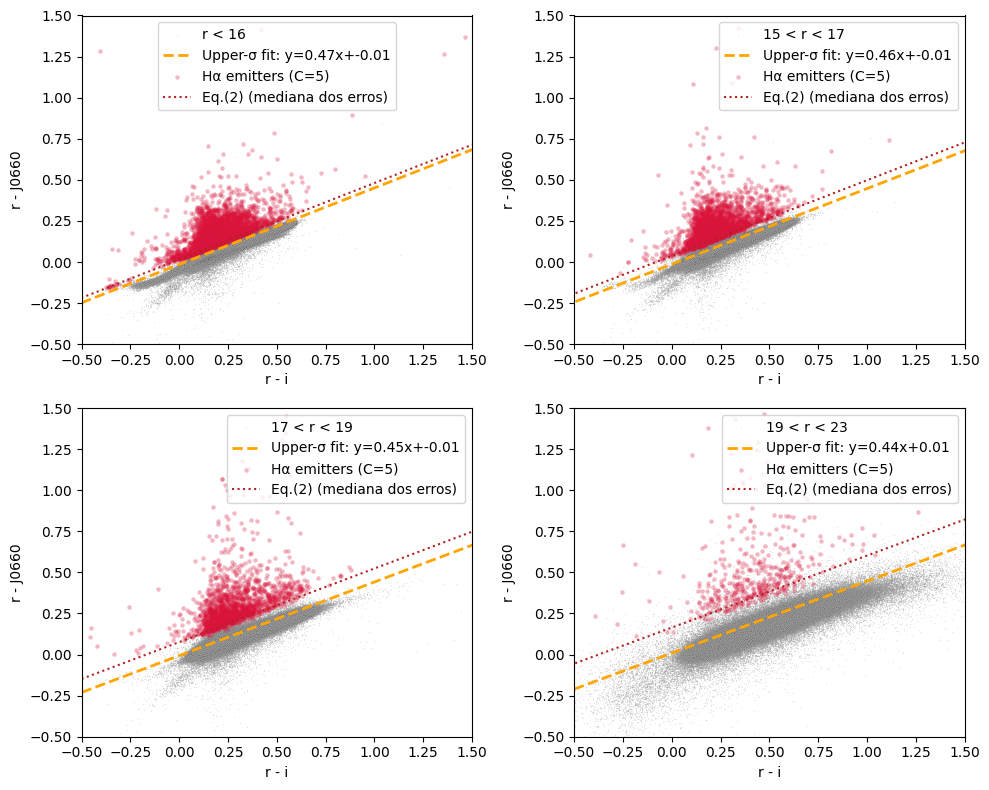

In [45]:
# ---------- Exemplo com seus 4 painéis ----------
plt.figure(figsize=(10, 8))
ax1 = plt.subplot(221); ax2 = plt.subplot(222); ax3 = plt.subplot(223); ax4 = plt.subplot(224)

ax1, em1 = plot_panel_eq12(ax1, df1, 'r < 16',   C=5.0)
ax2, em2 = plot_panel_eq12(ax2, df2, '15 < r < 17', C=5.0)
ax3, em3 = plot_panel_eq12(ax3, df3, '17 < r < 19', C=5.0)
ax4, em4 = plot_panel_eq12(ax4, df4, '19 < r < 23', C=5.0)

for ax in (ax1, ax2, ax3, ax4):
    ax.set_ylim(-0.5, 1.5)
    ax.set_xlim(-0.5, 1.5)
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
emitters = pd.concat([em1, em2, em3, em4])

In [ ]:
emitters.to_csv('../data/halpha_emitters.csv', index=False)

In [11]:
len(emitters)

12628

In [12]:
emitters = pd.read_csv('../data/halpha_emitters.csv')


In [13]:
emitters

,id,ra,dec,parallax,err_mag_pstotal_r,err_mag_pstotal_i,err_mag_pstotal_j0660,gaia_ruwe,gaia_parallax_over_error,gaia_classprob_dsc_combmod_star,gaia_in_qso_candidates,gaia_in_galaxy_candidates,gaia_phot_bp_rp_excess_factor,mag_pstotal_r,mag_pstotal_i,mag_pstotal_j0660
0,b'i06s22s0200YTA',0.721405,-27.864794,1.717745,0.002398,0.002135,0.003484,1.001016,65.069120,0.999866,0,0,1.214816,14.610466,14.420108,14.513275
1,b'i06s22s020125B',0.904604,-27.751411,0.826215,0.003231,0.002962,0.004699,1.002881,20.851864,0.999892,0,0,1.207785,15.287697,15.137383,15.199894
2,b'i06s22s020161V',1.815877,-27.638079,2.076998,0.001771,0.001550,0.002559,1.159390,96.315630,0.999826,0,0,1.223180,14.005713,13.804634,13.901240
3,b'i06s22s020180S',0.720824,-27.593325,1.712508,0.002062,0.001863,0.003005,1.071727,73.195640,0.999901,0,0,1.217120,14.233372,14.074953,14.146698
4,b'i06s42s2600DFO',58.315826,-54.685070,1.427383,0.002069,0.001966,0.002386,1.010032,112.017204,0.999806,0,0,1.201173,14.006945,13.869290,13.931618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12623,b'i06s33s500040U',328.673340,-43.334385,0.630560,0.017850,0.016111,0.010950,1.073597,3.475481,0.999992,0,0,1.270015,18.593195,18.103374,17.423925
12624,b'i06n10s1300CPW',167.701140,-12.460139,0.627220,0.020785,0.018080,0.018415,0.883108,3.543338,0.999991,0,0,1.233201,18.400152,18.095179,18.042578
12625,b'i06H007700MTD',150.648770,-33.852350,0.908550,0.012339,0.010239,0.011830,0.958194,7.469640,0.999982,0,0,1.268826,18.066492,17.611792,17.503569
12626,b'i06H007701G6O',149.729570,-33.286470,0.405441,0.013219,0.012397,0.012678,0.989213,3.052733,0.999977,0,0,1.235686,18.150673,17.870653,17.787880


In [1]:
emitters[emitters['mag_pstotal_r'] < 16]

NameError: name 'emitters' is not defined

In [14]:
from astroquery.xmatch import XMatch
import io
import astropy.units as u

table = XMatch.query(
    cat1=open('../data/halpha_emitters.csv'),
    cat2='simbad',
    max_distance=10* u.arcsec,
    colRA1='ra',
    colDec1='dec'
)

Could not import regions, which is required for some of the functionalities of this module.


In [15]:
tb = table.to_pandas()

In [16]:
len(table)

1449

In [17]:
tb.columns

Index(['angDist', 'id', 'ra', 'dec', 'parallax', 'err_mag_pstotal_r',
       'err_mag_pstotal_i', 'err_mag_pstotal_j0660', 'gaia_ruwe',
       'gaia_parallax_over_error', 'gaia_classprob_dsc_combmod_star',
       'gaia_in_qso_candidates', 'gaia_in_galaxy_candidates',
       'gaia_phot_bp_rp_excess_factor', 'mag_pstotal_r', 'mag_pstotal_i',
       'mag_pstotal_j0660', 'main_id', 'ra2', 'dec2', 'coo_err_maj',
       'coo_err_min', 'coo_err_angle', 'otype', 'nbref', 'ra_sexa', 'dec_sexa',
       'coo_qual', 'coo_bibcode', 'main_type', 'other_types', 'radvel',
       'radvel_err', 'redshift', 'redshift_err', 'sp_type', 'morph_type',
       'plx', 'plx_err', 'pmra', 'pmdec', 'pm_err_maj', 'pm_err_min',
       'pm_err_pa', 'size_maj', 'size_min', 'size_angle', 'B', 'V', 'R', 'J',
       'H', 'K', 'u', 'g', 'r', 'i', 'z'],
      dtype='object')

In [18]:
tb.groupby('main_type').size().reset_index(name='counts').sort_values(by='counts', ascending=False)

,main_type,counts
4,EclBin,937
27,Star,231
20,RRLyrae,94
7,Galaxy,40
30,Variable*,28
2,CataclyV*,19
16,PulsV*,14
25,RotV*,11
9,HighPM*,10
31,WhiteDwarf_Candidate,8


In [19]:
galaxies = tb[tb['otype'] == 'G']

In [20]:
galaxies.to_csv('../data/halpha_emitters_galaxies.csv', index=False)

In [21]:
binaries = tb[tb['main_type'].isin(['EclBin', 'EclBin_Candidate'])]

In [22]:
binaries.to_csv('../data/halpha_emitters_binaries.csv', index=False)

In [17]:
bands = ['u', 'J0378', 'J0395', 'J0410', 'J0430', 'g', 'J0515', 'r', 'J0660', 'i', 'J0861', 'z'] 
wavelengths_values = [3536, 3770, 3940, 4094, 4292, 4751, 5133, 6258, 6614, 7690, 8611, 8831]

In [23]:
tb1 = tb[['id','mag_pstotal_j0660', 'err_mag_pstotal_j0660', 'mag_pstotal_r', 'err_mag_pstotal_r', 'mag_pstotal_i', 'err_mag_pstotal_i']]

In [27]:
dtypes = {
    "id": "string",   # ou "string", dependendo do seu arquivo
    "ra": "float32",
    "dec": "float32",
    # --- erros ---
    "err_mag_pstotal_u": "float32",
    "err_mag_pstotal_j0378": "float32",
    "err_mag_pstotal_j0395": "float32",
    "err_mag_pstotal_j0410": "float32",
    "err_mag_pstotal_j0430": "float32",
    "err_mag_pstotal_g": "float32",
    "err_mag_pstotal_j0515": "float32",
    "err_mag_pstotal_r": "float32",
    "err_mag_pstotal_j0660": "float32",
    "err_mag_pstotal_i": "float32",
    "err_mag_pstotal_j0861": "float32",
    "err_mag_pstotal_z": "float32",
    # --- magnitudes ---
    "mag_pstotal_u": "float32",
    "mag_pstotal_j0378": "float32",
    "mag_pstotal_j0395": "float32",
    "mag_pstotal_j0410": "float32",
    "mag_pstotal_j0430": "float32",
    "mag_pstotal_g": "float32",
    "mag_pstotal_j0515": "float32",
    "mag_pstotal_r": "float32",
    "mag_pstotal_j0660": "float32",
    "mag_pstotal_i": "float32",
    "mag_pstotal_j0861": "float32",
    "mag_pstotal_z": "float32"
}

ids_set = set(tb1["id"])
chunks = []

for chunk in pd.read_csv(
    "../data/all_0.7frac.csv",
    engine="c",
    dtype=dtypes,
    usecols=list(dtypes.keys()),
    chunksize=100000,
    low_memory=False
):
    filtered_chunk = chunk[chunk["id"].isin(ids_set)]
    chunks.append(filtered_chunk)

tb1_all = pd.concat(chunks, ignore_index=True)

In [34]:
tb

,angDist,id,ra,dec,parallax,err_mag_pstotal_r,err_mag_pstotal_i,err_mag_pstotal_j0660,gaia_ruwe,gaia_parallax_over_error,...,V,R,J,H,K,u,g,r,i,z
0,0.207682,b'i06H014502XRE',151.471740,-44.128754,0.291422,0.005671,0.005405,0.006141,1.037979,6.702286,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.487865,b'i06n13s51005U1',218.923170,-16.728075,0.414555,0.006630,0.006447,0.006789,1.039911,6.339035,...,NaN,NaN,15.397,15.235,15.145,NaN,16.816000,16.386000,NaN,NaN
2,0.094063,b'i06s28s1000WIR',14.682229,-35.696968,1.418581,0.005613,0.004099,0.005266,1.081988,26.718450,...,16.709999,NaN,14.162,13.539,13.385,NaN,17.450001,16.400999,15.803,NaN
3,0.265115,b'i06s26s61012PH',338.181200,-33.008620,0.387270,0.006831,0.007056,0.006929,0.960380,6.016572,...,NaN,NaN,15.682,15.392,15.084,NaN,NaN,NaN,NaN,NaN
4,0.174875,b'i06n11s15003J3',169.745940,-14.120865,0.411106,0.006417,0.006152,0.008458,0.988726,5.324485,...,NaN,NaN,15.440,14.960,14.920,19.389999,17.933001,17.174000,16.930,16.858999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1444,0.105293,b'i06s07s0400IZP',328.491600,-8.250757,0.679195,0.004522,0.004133,0.004576,1.004942,13.583802,...,15.880000,NaN,NaN,NaN,NaN,NaN,16.524000,15.854000,NaN,NaN
1445,0.460767,b'i06H00280158N',161.979060,-24.807386,0.865093,0.006237,0.005662,0.006552,1.064835,15.926148,...,NaN,NaN,14.640,14.117,14.075,NaN,NaN,NaN,NaN,NaN
1446,0.061610,b'i06H008401431',162.967860,-33.361126,0.469247,0.004631,0.004199,0.005062,0.980997,8.846662,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1447,0.108327,b'i06H008401HZY',161.435360,-33.020596,0.460294,0.005069,0.004732,0.005513,1.009029,9.456275,...,16.794001,NaN,15.156,14.688,14.690,NaN,17.099001,16.465000,16.115,NaN


In [28]:
tb1_all

,id,ra,dec,err_mag_pstotal_g,err_mag_pstotal_i,err_mag_pstotal_j0378,err_mag_pstotal_j0395,err_mag_pstotal_j0410,err_mag_pstotal_j0430,err_mag_pstotal_j0515,...,mag_pstotal_j0378,mag_pstotal_j0395,mag_pstotal_j0410,mag_pstotal_j0430,mag_pstotal_j0515,mag_pstotal_j0660,mag_pstotal_j0861,mag_pstotal_r,mag_pstotal_u,mag_pstotal_z
0,b'i06n06s02008EO',151.764359,-7.184072,0.013896,0.008036,0.055286,0.072420,0.049963,0.044245,0.025366,...,18.953800,18.824753,18.360310,18.247993,17.676386,17.034372,16.866241,17.212770,19.025307,16.930996
1,b'i06S82011500CJM',319.680756,-0.996582,0.014360,0.013041,0.069114,0.112554,0.051702,0.040877,0.024770,...,19.252172,19.409475,18.614473,18.455444,17.881763,17.399086,17.148508,17.614162,19.481382,17.262800
2,b'i06S82011500OBY',320.166168,-0.656701,0.005565,0.004334,0.020800,0.025257,0.015561,0.013657,0.008925,...,17.512503,17.383150,16.805653,16.754347,16.157810,15.682942,15.522611,15.852941,17.816278,15.529667
3,b'i06S820057017YW',38.907318,-0.064380,0.008857,0.004243,0.045805,0.056901,0.027186,0.021905,0.011873,...,19.029140,18.774103,18.053072,17.914661,17.210203,16.442341,16.149805,16.950443,19.543341,16.333624
4,b'i06n11s3400YFQ',195.296677,-13.336882,0.002469,0.001708,0.006897,0.008697,0.006859,0.006358,0.004176,...,15.464609,15.425169,14.986841,14.936233,14.536867,14.218475,14.089524,14.283864,15.613531,14.167738
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1415,b'i06n01s2200MXK',179.806366,0.143219,0.002801,0.001913,0.006643,0.007655,0.006329,0.006003,0.004866,...,15.090648,14.789363,14.553919,14.521867,14.292667,14.163053,14.148529,14.178535,15.565620,14.162992
1416,b'i06n12s2400B3O',184.164490,-15.265761,0.002910,0.001626,0.010942,0.013336,0.009511,0.008355,0.005002,...,16.491392,16.223492,15.696042,15.548709,14.856382,14.116528,13.814519,14.269518,16.469460,13.852398
1417,b'i06H012601ZR9',160.115845,-40.078285,0.005818,0.003498,0.029583,0.057783,0.020006,0.018116,0.010479,...,18.004980,17.909153,17.296629,17.215017,16.508778,15.710789,15.446312,15.966419,17.915344,15.582954
1418,b'i06H012602FQN',161.241531,-39.798161,0.003544,0.002025,0.020408,0.036296,0.012436,0.011036,0.006331,...,17.235132,17.002899,16.355556,16.221416,15.449566,14.652474,14.387771,14.839036,17.153692,14.425797


In [35]:
tb1_all = tb1_all.merge(tb[['id', 'main_type', 'main_id']], on='id', suffixes=('_all', '_matched'))

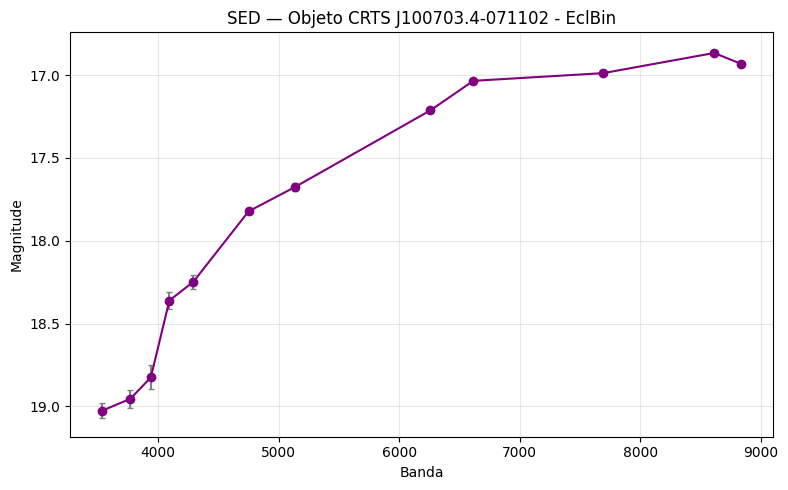

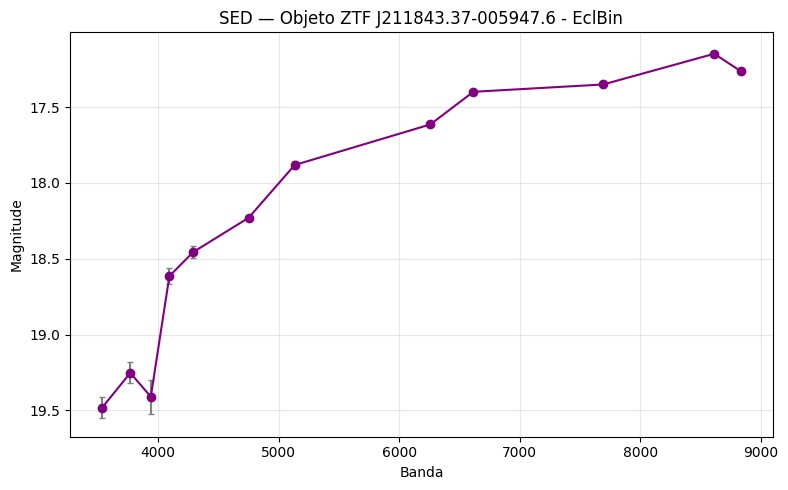

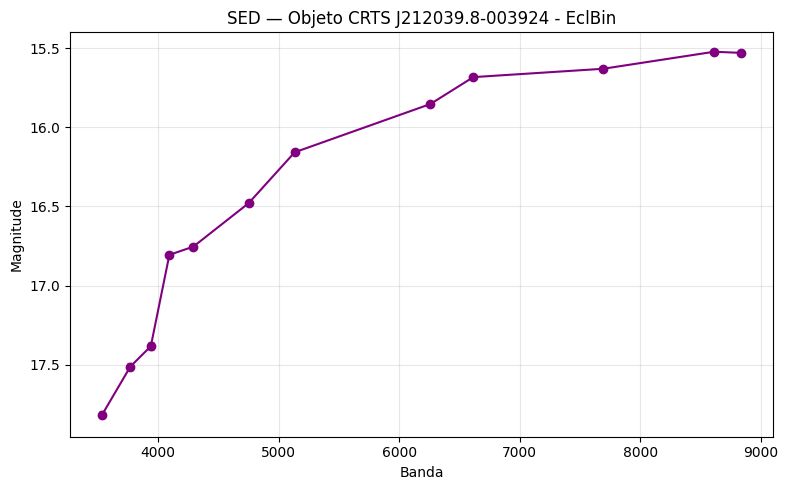

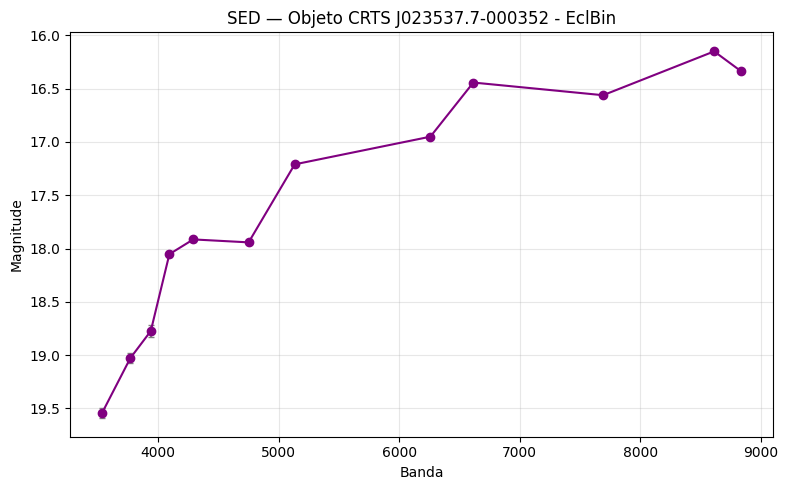

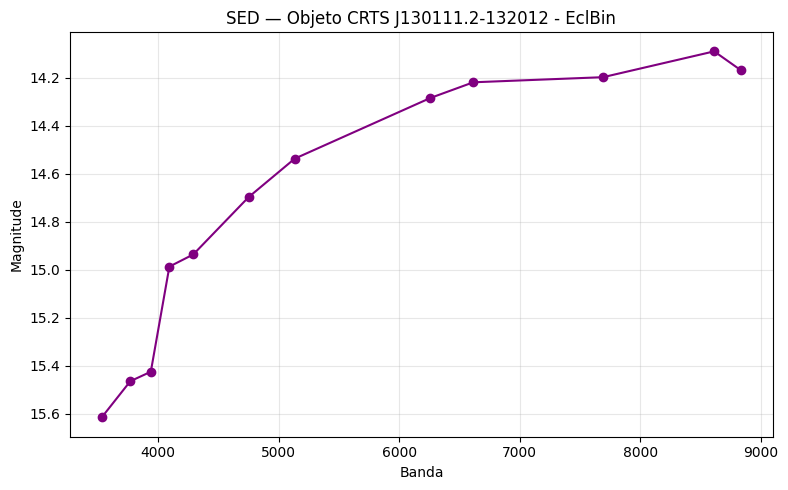

...

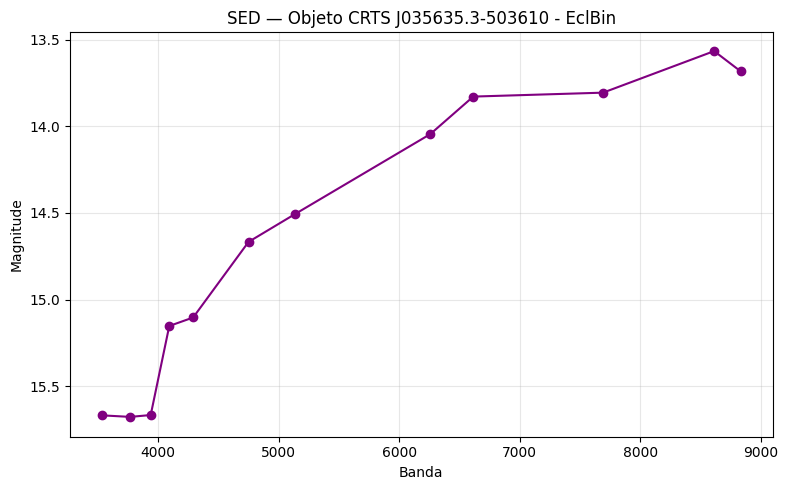

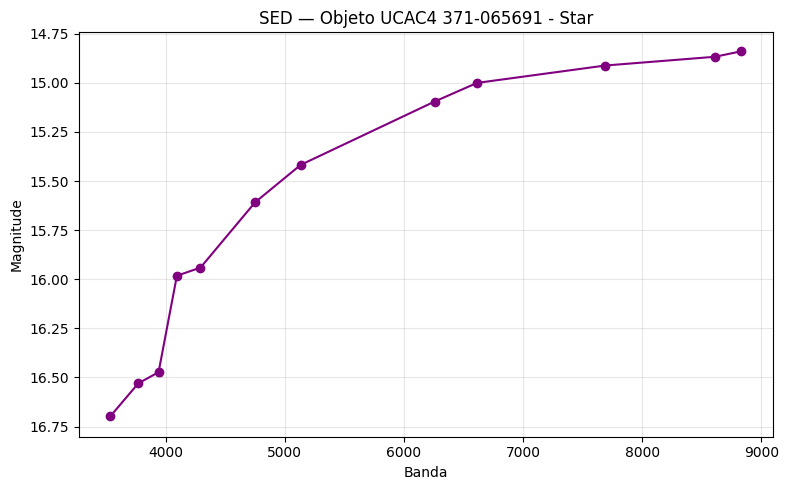

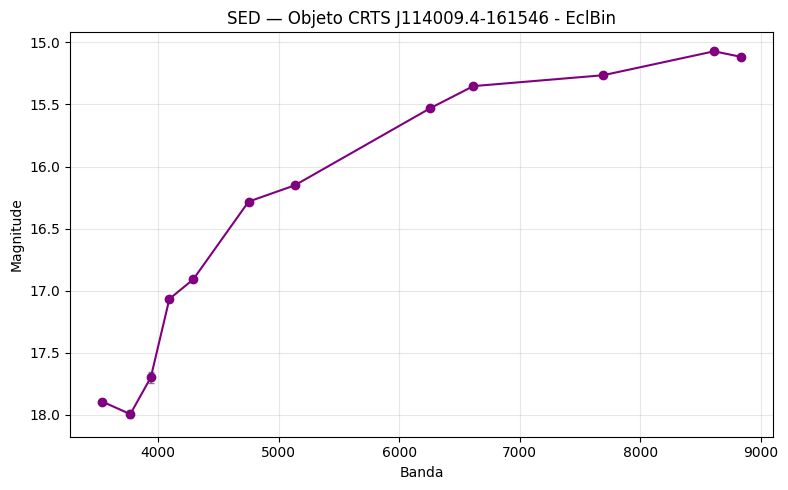

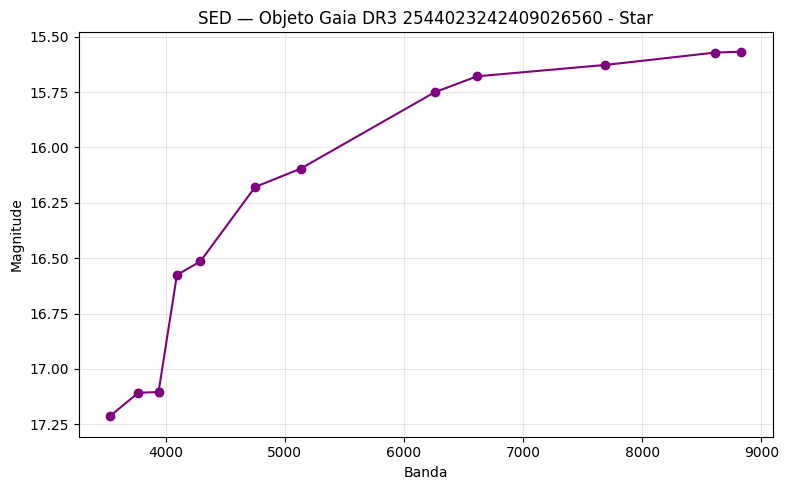

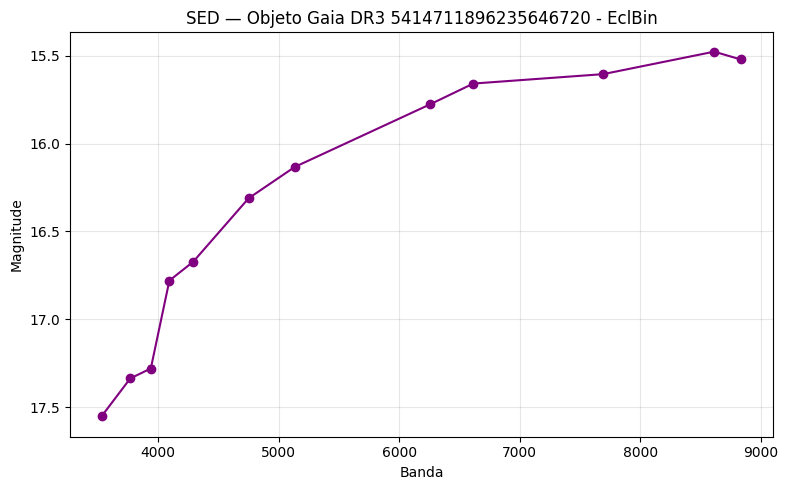

KeyboardInterrupt: 

In [37]:
import numpy as np
import matplotlib.pyplot as plt

bands = ['u', 'J0378', 'J0395', 'J0410', 'J0430', 'g', 'J0515', 'r', 'J0660', 'i', 'J0861', 'z']
wavelengths = np.array([3536, 3770, 3940, 4094, 4292, 4751, 5133, 6258, 6614, 7690, 8611, 8831])

mag_cols = [f"mag_pstotal_{b.lower()}" for b in bands]

# se tiver erros de magnitude também:
err_cols = [f"err_mag_pstotal_{b.lower()}" for b in bands]
has_errors = all(col in tb1_all.columns for col in err_cols)

for idx, row in tb1_all.iterrows():
    mags = row[mag_cols].to_numpy()
    
    plt.figure(figsize=(8, 5))
    if has_errors:
        errs = row[err_cols].to_numpy()
        plt.errorbar(bands, mags, yerr=errs, fmt='o-', color='purple', ecolor='gray', capsize=2)
    else:
        plt.plot(bands, mags, 'o-', color='purple')
    
    plt.gca().invert_yaxis()  # magnitude astronômica: menor = mais brilhante
    plt.xlabel('Banda')
    plt.ylabel('Magnitude')
    plt.title(f'SED — Objeto {tb1_all.iloc[idx]["main_id"]} - {tb1_all.iloc[idx]["main_type"]}')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()